# Дипломная работа по NLP

«Создание аналитической информационной системы для выделения ключевых слов из учебных материалов»

## Выполнил: студент группы ПИ20-5, Валяев Георгий Анатольевич

В этом скрипте будут реализованы процессы:
- использования структуры датасета как результаты работы скрипта `DOCX_parser_Valyaev.ipynb`
- создания модели NLP, решающей задачу выделения ключевых слов в файле РПД
- подготовки финального датасета с ключевыми словами для последующей выгрузки в Google таблицу (базу данных классов дисциплин информационной системы)

**Все изменения и версии ноутбуков хранятся на репозитории GitHub:
https://github.com/Valyaevgeorgiy/VKR_work**

Полезные материалы и литература к работе:
- https://neurohive.io/ru/osnovy-data-science/7-arhitektur-nejronnyh-setej-nlp/
- https://neurohive.io/ru/papers/depth-estimation-using-encoder-decoder-networks-and-self-supervised-learning/
- https://nlp.stanford.edu/courses/cs224n/2011/reports/ehhuang.pdf

In [13]:
import os, json, nltk
from google.colab import drive

## Подгрузка датасета

In [2]:
PATH = '/content/gdrive/MyDrive/Диплом_Валяев/data'

docs_rpd_data = PATH+'/rpd_data.json'
docs_name_to_file_rpd = PATH+'/name_to_file_rpd.json'

drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


### Датасет корпусов текстов РПД

In [3]:
with open(docs_rpd_data, 'r', encoding='utf-8') as file:
  rpd_data = json.load(file)

rpd_data

{'прикладные задачи машинного обучения и обработки больших данных 2020': {'SODERZ': ['реализация решений обработки больших данных',
   'развертывание кластеров hdinsight прием данных для пакетной и интерактивной обработки прием данных из облака или локальных данных управление hadoop и spark создание и настройка кластера отладка заданий hadoop и spark прием данных в apache spark реализация пакетных решений для больших данных с помощью spark реализация интерактивных запросов для больших данных с помощью spark sql',
   'информационные технологии анализа данных',
   'задачи анализа данных понятие набора данных dataset подготовительные операции для выполнения анализа данных технологический стек анализа данных построенный на базе языка программирования python интерактивная оболочка ipython notebook принципы работы и применение для решения задач анализа данных и машинного обучения знакомство с библиотеками numpy и pandas',
   'технологии машинного обучения',
   'постановки задач машинного обу

### Датасет индексов РПД и их файлов

In [4]:
with open(docs_name_to_file_rpd, 'r', encoding='utf-8') as file:
  name_to_file_rpd = json.load(file)

name_to_file_rpd

{'прикладные задачи машинного обучения и обработки больших данных 2020': 'Прикл задачи МОиОБД, Эк, КФУ.docx',
 'методы визуализации данных 2020': 'Методы ВД,Эк,КФУ.docx',
 'программирование на языках python и sql 2020': 'Програм. на языках PYTHON и SQL,Эк, КФУ.docx',
 'нейронные сети 2020': 'Нейронные сети,Эк, КФУ.docx',
 'обработка данных и моделирование в microsoft excel 2020': 'Обработка данных и мод. в МЕ,Эк, КФУ.docx',
 'интернет вещей 2021': 'Инт вещей, ПИ, 2021.docx',
 'агентное моделирование 2021': 'Агент мод.docx',
 'интеллектуальные технологии в управлении рисками 2021': 'Интел тех в УР.docx',
 'современные нейросетевые технологии 2021': 'Соврем НТ, 2021.docx',
 'бухгалтерские информационные системы 2021': 'Бухгалтерские ИС.docx',
 'дифференциальные уравнения 2021': 'Диф урав.docx',
 'методология поиска источников данных и подготовки данных для анализа 2021': 'Метод ПИДиПДДА.docx',
 'автоматизированные системы бухгалтерского учета, анализа и аудита в коммерческих организаци

## NLP модель

Концепт работы NLP модели в рамках всей работы:

- в корпусах текстов каждой дисциплины мы выделяем ключевые слова (при помощи модели или иными способами)
- сохраняем подготовленные ключевые слова по каждой дисциплине
- создаём гугл-табличку как своего рода базу данных дисциплин и ключевых слов, в которой будем использовать ключевые слова и название дисциплины
- в рамках работы умного Telegram бота добавим функционал следующего рода: он будет считывать любой вводимый пользователем текст и проходиться по каждому слову, чтобы подсчитать расстояние Дамерау-Левенштейна по сравнению с набором ключевых слов, которые выделила NLP модель ранее, после чего класс (название дисциплины) с меньшим итоговым просуммированным расстоянием Дамерау-Левенштейна будет считан ботом как целевой, который искал пользователь, набирая текст
- далее бот в следующем сообщении предложит пользователю топ-5 классов наиболее близких по расстоянию Дамерау-Левенштейна в формате inline-кнопок
- пользователь нажимает на одну из кнопок, и ему выдаётся полная информация о дисциплине и РПД, которую он искал изначально по своему запросу

### Промежуточная аналитика текста

In [5]:
rpd_data['проектирование информационных систем пии 2023']['SODERZ'] + rpd_data['проектирование информационных систем пии 2023']['QUESKR'] + rpd_data['проектирование информационных систем пии 2023']['QUESSESS'] + rpd_data['проектирование информационных систем пии 2023']['QUESSEMS']

['тема основные понятия технологии проектирования информационных систем',
 'основные понятия и определения классификация информационных систем эволюция информационных технологий и информационных систем корпоративные информационные системы их виды и назначение проблемы разработки сложных программных систем исторические аспекты развития технологий проектирования информационных систем',
 'тема жизненный цикл информационных систем',
 'понятие жизненного цикла информационной системы ис каскадная модель жизненного цикла информационной системы поэтапная модель жизненного цикла информационной системы с промежуточным контролем стандартизация процессов разработки программ и программной документации схема жизненного цикла больших программных комплексов по в в липаеву спиральная модель жизненного цикла информационных систем эволюция моделей жизненного цикла информационных систем',
 'тема стандарты проектирования информационных систем',
 'отечественный стандарт жизненного цикла автоматизированных с

In [6]:
rpd_nn_data = {}
total_sent = []
total_words = []

for ind, disc in enumerate(list(rpd_data.keys())):
  print(f'{ind+1}) {disc}')

  if 'QUESKR' in rpd_data[disc].keys():
    rpd_nn_data[disc] = rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS']

    num_sent = len(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])
    num_words = sum([len(sent) for sent in list(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESKR'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])])
  else:
    rpd_nn_data[disc] = rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS']

    num_sent = len(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])
    num_words = sum([len(sent) for sent in list(rpd_data[disc]['SODERZ'] + rpd_data[disc]['QUESSESS'] + rpd_data[disc]['QUESSEMS'])])

  total_sent.append(num_sent)
  total_words.append(num_words)

  print(f'Кол-во предложений = {num_sent}')
  print(f'Кол-во слов = {num_words}')
  print('OK!')
  print()
  print()

1) прикладные задачи машинного обучения и обработки больших данных 2020
Кол-во предложений = 58
Кол-во слов = 3563
OK!


2) методы визуализации данных 2020
Кол-во предложений = 35
Кол-во слов = 5988
OK!


3) программирование на языках python и sql 2020
Кол-во предложений = 64
Кол-во слов = 4301
OK!


4) нейронные сети 2020
Кол-во предложений = 55
Кол-во слов = 3885
OK!


5) обработка данных и моделирование в microsoft excel 2020
Кол-во предложений = 30
Кол-во слов = 2723
OK!


6) интернет вещей 2021
Кол-во предложений = 107
Кол-во слов = 7362
OK!


7) агентное моделирование 2021
Кол-во предложений = 47
Кол-во слов = 3901
OK!


8) интеллектуальные технологии в управлении рисками 2021
Кол-во предложений = 79
Кол-во слов = 9813
OK!


9) современные нейросетевые технологии 2021
Кол-во предложений = 114
Кол-во слов = 6891
OK!


10) бухгалтерские информационные системы 2021
Кол-во предложений = 120
Кол-во слов = 20710
OK!


11) дифференциальные уравнения 2021
Кол-во предложений = 128
Кол-во 

In [7]:
sum(total_sent), (sum(total_sent) / len(total_sent))

(46645, 114.88916256157636)

In [8]:
sum(total_words), (sum(total_words) / len(total_words))

(4404469, 10848.445812807882)

In [9]:
rpd_nn_data

{'прикладные задачи машинного обучения и обработки больших данных 2020': ['реализация решений обработки больших данных',
  'развертывание кластеров hdinsight прием данных для пакетной и интерактивной обработки прием данных из облака или локальных данных управление hadoop и spark создание и настройка кластера отладка заданий hadoop и spark прием данных в apache spark реализация пакетных решений для больших данных с помощью spark реализация интерактивных запросов для больших данных с помощью spark sql',
  'информационные технологии анализа данных',
  'задачи анализа данных понятие набора данных dataset подготовительные операции для выполнения анализа данных технологический стек анализа данных построенный на базе языка программирования python интерактивная оболочка ipython notebook принципы работы и применение для решения задач анализа данных и машинного обучения знакомство с библиотеками numpy и pandas',
  'технологии машинного обучения',
  'постановки задач машинного обучения объекты и 

### Фиксация набора стоп-слов

1 набор — стандартный из библиотеки nltk

In [14]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


2 набор — более полный в публичном [репозитории GitHub](https://github.com/stopwords-iso/stopwords-ru)

In [17]:
!npm install stopwords-ru

npm WARN saveError ENOENT: no such file or directory, open '/content/package.json'
npm notice created a lockfile as package-lock.json. You should commit this file.
npm WARN enoent ENOENT: no such file or directory, open '/content/package.json'
npm WARN content No description
npm WARN content No repository field.
npm WARN content No README data
npm WARN content No license field.

+ stopwords-ru@0.3.0
added 1 package from 1 contributor and audited 1 package in 0.697s
found 0 vulnerabilities



In [18]:
with open('node_modules/stopwords-ru/stopwords-ru.json', 'r') as file:
  stop_words = json.load(file)

stop_words

['c',
 'а',
 'алло',
 'без',
 'белый',
 'близко',
 'более',
 'больше',
 'большой',
 'будем',
 'будет',
 'будете',
 'будешь',
 'будто',
 'буду',
 'будут',
 'будь',
 'бы',
 'бывает',
 'бывь',
 'был',
 'была',
 'были',
 'было',
 'быть',
 'в',
 'важная',
 'важное',
 'важные',
 'важный',
 'вам',
 'вами',
 'вас',
 'ваш',
 'ваша',
 'ваше',
 'ваши',
 'вверх',
 'вдали',
 'вдруг',
 'ведь',
 'везде',
 'вернуться',
 'весь',
 'вечер',
 'взгляд',
 'взять',
 'вид',
 'видел',
 'видеть',
 'вместе',
 'вне',
 'вниз',
 'внизу',
 'во',
 'вода',
 'война',
 'вокруг',
 'вон',
 'вообще',
 'вопрос',
 'восемнадцатый',
 'восемнадцать',
 'восемь',
 'восьмой',
 'вот',
 'впрочем',
 'времени',
 'время',
 'все',
 'все еще',
 'всегда',
 'всего',
 'всем',
 'всеми',
 'всему',
 'всех',
 'всею',
 'всю',
 'всюду',
 'вся',
 'всё',
 'второй',
 'вы',
 'выйти',
 'г',
 'где',
 'главный',
 'глаз',
 'говорил',
 'говорит',
 'говорить',
 'год',
 'года',
 'году',
 'голова',
 'голос',
 'город',
 'да',
 'давать',
 'давно',
 'даже',
 'д

In [58]:
stop_words = sorted(list(set(stop_words + stopwords.words('russian') + ['тема', 'какой', 'какие', 'основные', 'основной', 'существуют', 'используются', 'работы'])))
stop_words

['c',
 'а',
 'алло',
 'без',
 'белый',
 'близко',
 'более',
 'больше',
 'большой',
 'будем',
 'будет',
 'будете',
 'будешь',
 'будто',
 'буду',
 'будут',
 'будь',
 'бы',
 'бывает',
 'бывь',
 'был',
 'была',
 'были',
 'было',
 'быть',
 'в',
 'важная',
 'важное',
 'важные',
 'важный',
 'вам',
 'вами',
 'вас',
 'ваш',
 'ваша',
 'ваше',
 'ваши',
 'вверх',
 'вдали',
 'вдруг',
 'ведь',
 'везде',
 'вернуться',
 'весь',
 'вечер',
 'взгляд',
 'взять',
 'вид',
 'видел',
 'видеть',
 'вместе',
 'вне',
 'вниз',
 'внизу',
 'во',
 'вода',
 'война',
 'вокруг',
 'вон',
 'вообще',
 'вопрос',
 'восемнадцатый',
 'восемнадцать',
 'восемь',
 'восьмой',
 'вот',
 'впрочем',
 'времени',
 'время',
 'все',
 'все еще',
 'всегда',
 'всего',
 'всем',
 'всеми',
 'всему',
 'всех',
 'всею',
 'всю',
 'всюду',
 'вся',
 'всё',
 'второй',
 'вы',
 'выйти',
 'г',
 'где',
 'главный',
 'глаз',
 'говорил',
 'говорит',
 'говорить',
 'год',
 'года',
 'году',
 'голова',
 'голос',
 'город',
 'да',
 'давать',
 'давно',
 'даже',
 'д

### Word2Vec модель

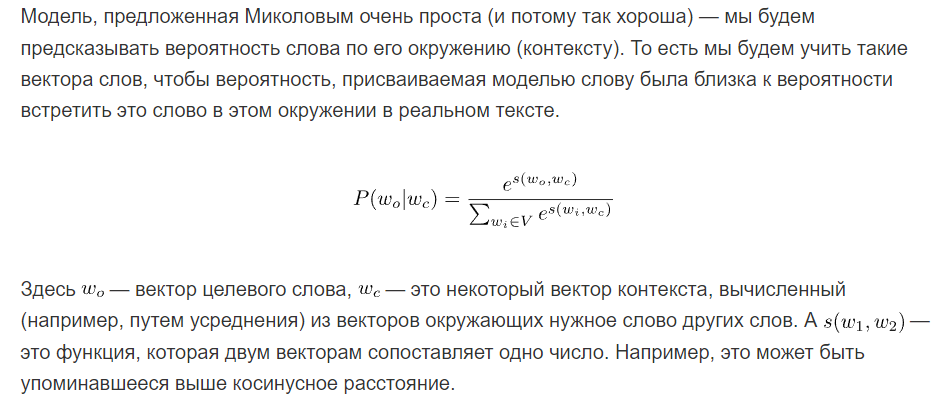

### TF-IDF

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
from pymystem3 import Mystem

[Статья](https://habr.com/ru/companies/otus/articles/755772/) с подробным разбором логики работы

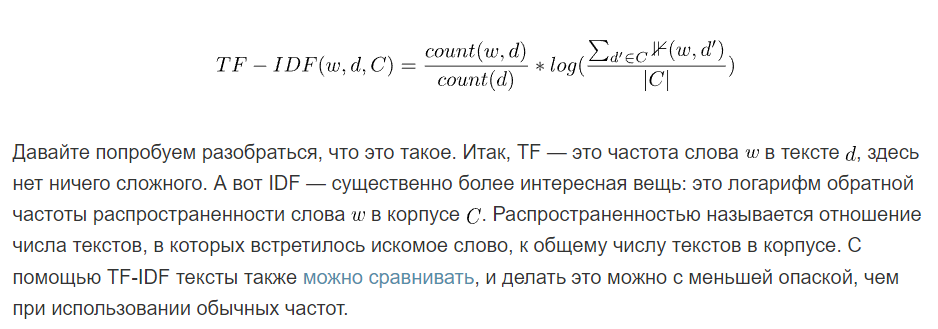

#### Лемматизация текста

In [27]:
moi_analizator = Mystem()

Installing mystem to /root/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [66]:
def preprocess_for_tfidf(text):
  lemmatized_text = moi_analizator.lemmatize(text.lower())
  return ' '.join(lemmatized_text)

In [ ]:
# датасет
# ключ (дисциплина) - значение (корпус текста)

# TF - частота встречаемости слова в корпусе текста дисциплины
# IDF - обратная частота встречаемости слова в корпусах текстов

# TF = количество раз, которое слово встречается в дисциплине / общее число слов в дисциплине
# IDF = log(число дисциплин/число дисциплин, в которых встречается слово)

#### Подготовка датасета

In [76]:
example = [', '.join(rpd_nn_data['mlops 2022']), ', '.join(rpd_nn_data['web программирование пи 2023']), ', '.join(rpd_nn_data['алгебра и анализ пи 2023'])]
example

['тема введение в mlops, что такое mlops и зачем он нужен определение интеллектуальных информационных систем особенности иис жизненный цикл программного обеспечения неприменимость классических моделей жизненного цикла к иис, методология mlops принципы devops и data science в mlops контроль версий и автоматизированные сборочные процессы, тема инфраструктура для автоматизации процесса разработки обучения и развертывания моделей машинного обучения, как создать инфраструктуру для mlops настройка среды разработки и обучения моделей настройка инструментов для автоматического развертывания моделей встраивание моделей машинного обучения в информационные продукты инфраструктура иис зависимость от внешней среды, взаимосвязь разработки в ноутбуках и продуктовом окружении, тема непрерывная интеграция и доставка в mlops, классический конвейер ci cd особенности иис основные риски этапизация проекта по разработке и внедрению иис инструментальные средства непрерывной доставки и интеграции иис, особенн

#### Тестирование

In [77]:
tf_idf_object = TfidfVectorizer(stop_words=stop_words)
txts_as_tf_idf_vectors = tf_idf_object.fit_transform(preprocess_for_tfidf(text) for text in example)

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['хотел'] not in stop_words.
  warnings.warn(


In [78]:
txts_as_tf_idf_vectors

<3x682 sparse matrix of type '<class 'numpy.float64'>'
	with 781 stored elements in Compressed Sparse Row format>

In [79]:
print(txts_as_tf_idf_vectors.shape)

(3, 682)


In [80]:
tf_idf_object.get_feature_names_out()[:100]

array(['ajax', 'api', 'bootstrap', 'cd', 'cgi', 'ci', 'cms', 'crud',
       'css', 'data', 'development', 'devops', 'dom', 'express',
       'fastapi', 'fetchapi', 'flexbox', 'ftp', 'github', 'google',
       'graphql', 'grid', 'html', 'http', 'ide', 'imdb', 'io',
       'javascript', 'js', 'json', 'jsx', 'leaflet', 'less',
       'localstorage', 'mlops', 'mongodb', 'node', 'npm', 'orm',
       'outliers', 'pages', 'python', 'react', 'redux', 'rest', 'restapi',
       'sass', 'science', 'sequelize', 'socket', 'sqlalchemy', 'tokens',
       'tools', 'typescript', 'uri', 'url', 'web', 'webstorm', 'wide',
       'wordpress', 'world', 'xml', 'автоматизация', 'автоматизированный',
       'автоматический', 'авторизация', 'адаптация', 'адаптивный',
       'административный', 'алгебра', 'алгебраический', 'алгоритм',
       'альтернатива', 'альтернативный', 'анализ', 'аналог', 'аргумент',
       'арифметический', 'архитектура', 'асимптота', 'атрибут',
       'аттестация', 'аутентификация', 'баз

In [81]:
# соответствие между числовыми индексами слов матрицы TF-IDF и самими словами
id2word = {i:word for i, word in enumerate(tf_idf_object.get_feature_names_out())}

# проходимся по матрице и вытащим для каждого текста слова с самым большим tf-idf

for text_row in range(txts_as_tf_idf_vectors.shape[0]):
  # ряд матрицы соответствует тексту
  row_data = txts_as_tf_idf_vectors.getrow(text_row)
  # сортируем в нём все слова (вернее, индексы слов)
  words_this_text = row_data.toarray().argsort()
  # берём крайние 5 слов отсортированного ряда
  top_words_this_text = words_this_text[0, :-6:-1]
  print([id2word[w] for w in top_words_this_text])

['обучение', 'mlops', 'машинный', 'модель', 'связанный']
['веб', 'html', 'css', 'приложение', 'страница']
['матрица', 'функция', 'уравнение', 'вычисление', 'линейный']


#### Функция подсчёта метрики TF-IDF

In [92]:
def produce_tf_idf_keywords(texts, number_keywords):
  tf_idf_v = TfidfVectorizer(stop_words=stop_words)
  txts_as_tf_idf_vectors = tf_idf_v.fit_transform(preprocess_for_tfidf(text) for text in texts)

  # соответствие между числовыми индексами слов матрицы TF-IDF и самими словами
  id2word = {i:word for i, word in enumerate(tf_idf_v.get_feature_names_out())}

  # проходимся по матрице и вытащим для каждого текста слова с самым большим tf-idf
  top_keywords = []
  for text_row in range(txts_as_tf_idf_vectors.shape[0]):
    # ряд матрицы соответствует тексту
    row_data = txts_as_tf_idf_vectors.getrow(text_row)
    # сортируем в нём все слова (вернее, индексы слов)
    words_this_text = row_data.toarray().argsort()
    # берём крайние {number_keywords} слов отсортированного ряда
    top_words_this_text = words_this_text[0, :-1*(number_keywords+1):-1]
    top_keywords.append([id2word[w] for w in top_words_this_text])

  return top_keywords

In [94]:
produce_tf_idf_keywords(example, 5)

[['обучение', 'mlops', 'машинный', 'модель', 'связанный'],
 ['веб', 'html', 'css', 'приложение', 'страница'],
 ['матрица', 'функция', 'уравнение', 'вычисление', 'линейный']]